**References :**

https://salu133445.github.io/lakh-pianoroll-dataset/dataset

https://github.com/salu133445/lakh-pianoroll-dataset/tree/main

In [ ]:
!apt-get update -qq && apt-get install -qq fluid-soundfont-gm build-essential libasound2-dev libjack-dev
!pip install -qU pyfluidsynth pretty_midi
!sudo apt-get install fluidsynth
!pip install torch-fidelity
!pip install pytorch-fid
!pip install pypianoroll
!pip install mir_eval
!pip install music21

In [ ]:
# Imports

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import mir_eval
import mir_eval.display
import IPython.display
import os
import sys
import json
import time
import torch
import random
import tables
import librosa
import pathlib
import pretty_midi
import pypianoroll
import torchvision
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.autograd import Variable
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid, save_image
from torchvision.transforms import functional as TF
from torch.utils.data import DataLoader, TensorDataset, Dataset
from IPython.display import HTML, display
from pytorch_fid import fid_score
from datetime import datetime
from tqdm import tqdm
from torch.optim.lr_scheduler import StepLR
from google.colab import drive


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd "/content/drive/My Drive/682 Project"

/content/drive/My Drive/682 Project


In [ ]:
root_dir = '/content/drive/MyDrive/682 Project'
data_dir = root_dir + '/Lakh Piano Dataset/lpd_17/lpd_17_cleansed'

In [ ]:
# Local path constants
DATA_PATH = 'data'
RESULTS_PATH = 'results'

# Utility functions for retrieving paths
def msd_id_to_dirs(msd_id):
    """Given an MSD ID, generate the path prefix.
    E.g. TRABCD12345678 -> A/B/C/TRABCD12345678"""
    return os.path.join(msd_id[2], msd_id[3], msd_id[4], msd_id)

def msd_id_to_mp3(msd_id):
    """Given an MSD ID, return the path to the corresponding mp3"""
    return os.path.join(DATA_PATH, 'msd', 'mp3',
                        msd_id_to_dirs(msd_id) + '.mp3')

def msd_id_to_h5(h5):
    """Given an MSD ID, return the path to the corresponding h5"""
    return os.path.join(RESULTS_PATH, 'lmd_matched_h5',
                        msd_id_to_dirs(msd_id) + '.h5')

def get_midi_npz_path(msd_id, midi_md5):
    return os.path.join(data_dir,
                        msd_id_to_dirs(msd_id), midi_md5 + '.npz')

def get_midi_path(msd_id, midi_md5, kind):
    """Given an MSD ID and MIDI MD5, return path to a MIDI file.
    kind should be one of 'matched' or 'aligned'. """
    return os.path.join(RESULTS_PATH, 'lmd_{}'.format(kind),
                        msd_id_to_dirs(msd_id), midi_md5 + '.mid')

In [ ]:
# Open the cleansed ids - cleansed file ids : msd ids
cleansed_ids = pd.read_csv(os.path.join(root_dir, 'Lakh Piano Dataset', 'cleansed_ids.txt'), delimiter = '    ', header = None)
lpd_to_msd_ids = {a:b for a, b in zip(cleansed_ids[0], cleansed_ids[1])}
msd_to_lpd_ids = {a:b for a, b in zip(cleansed_ids[1], cleansed_ids[0])}

<ipython-input-5-a153e6f0ebd3>:2: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  cleansed_ids = pd.read_csv(os.path.join(root_dir, 'Lakh Piano Dataset', 'cleansed_ids.txt'), delimiter = '    ', header = None)


In [ ]:
rock_song_ids = []

# Open the file in read mode
with open('/content/drive/MyDrive/682 Project/Lakh Piano Dataset/labels/tagtraum/id_list_Rock.txt', 'r') as file:
    # Read lines and remove leading/trailing whitespace
    rock_song_ids.extend([line.strip() for line in file.readlines()])

# Open the file in read mode
with open('/content/drive/MyDrive/682 Project/Lakh Piano Dataset/labels/lastfm/id_list_rock.txt', 'r') as file:
    # Read lines and remove leading/trailing whitespace
    rock_song_ids.extend([line.strip() for line in file.readlines()])

# Open the file in read mode
with open('/content/drive/MyDrive/682 Project/Lakh Piano Dataset/labels/amg/id_list_Pop_Rock.txt', 'r') as file:
    # Read lines and remove leading/trailing whitespace
    rock_song_ids.extend([line.strip() for line in file.readlines()])


# Randomly choose 1000 songs out of these
train_ids = random.choices(rock_song_ids, k = 1000)

In [ ]:
# StandardTrack(name='Drums', program=0, is_drum=True, pianoroll=array(shape=(1249, 128), dtype=uint8))
# StandardTrack(name='Piano', program=0, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=uint8))
# StandardTrack(name='Chromatic Percussion', program=8, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=uint8))
# BinaryTrack(name='Organ', program=16, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=bool))
# StandardTrack(name='Guitar', program=24, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=uint8))
# StandardTrack(name='Bass', program=32, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=uint8))
# BinaryTrack(name='Strings', program=40, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=bool))
# StandardTrack(name='Ensemble', program=48, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=uint8))
# BinaryTrack(name='Brass', program=56, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=bool))
# BinaryTrack(name='Reed', program=64, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=bool))
# StandardTrack(name='Pipe', program=72, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=uint8))
# BinaryTrack(name='Synth Lead', program=80, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=bool))
# BinaryTrack(name='Synth Pad', program=88, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=bool))
# BinaryTrack(name='Synth Effects', program=96, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=bool))
# BinaryTrack(name='Ethnic', program=104, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=bool))
# BinaryTrack(name='Percussive', program=112, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=bool))
# StandardTrack(name='Sound Effects', program=120, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=uint8))

In [ ]:
combined_pianorolls_path = 'rock_1000_combined_pianorolls.pt'
# Check if the tensor file already exists
if os.path.exists(combined_pianorolls_path):
   # If the file exists, load the tensor
   combined_pianorolls = torch.load(combined_pianorolls_path)
else:
 combined_pianorolls = []
 for msd_file_name in train_ids:


   lpd_file_name = msd_to_lpd_ids[msd_file_name]
   # Get the NPZ path
   npz_path = get_midi_npz_path(msd_file_name, lpd_file_name)
   multitrack = pypianoroll.load(npz_path)
   multitrack.set_resolution(4).pad_to_same()


   # Initialize parts for all tracks
   parts = {track_name: None for track_name in [
       'Drums', 'Piano', 'Chromatic Percussion', 'Organ', 'Guitar', 'Bass',
       'Strings', 'Ensemble', 'Brass', 'Reed', 'Pipe', 'Synth Lead', 'Synth Pad',
       'Synth Effects', 'Ethnic', 'Percussive', 'Sound Effects'
   ]}


   # Initialize an empty array to use for missing parts
   empty_array = None


   # Process each track in the multitrack
   for track in multitrack.tracks:
       if track.pianoroll.shape[0] > 0 and empty_array is None:
           empty_array = np.zeros_like(track.pianoroll)
       parts[track.name] = track.pianoroll if track.pianoroll.shape[0] > 0 else empty_array.copy()


   # Stack all parts together
   combined_pianoroll = torch.stack([torch.tensor(parts[track_name], dtype=torch.uint8) for track_name in parts])


   # Append the combined pianoroll to the list
   combined_pianorolls.append(combined_pianoroll)


 # Save the combined pianorolls to a file
 torch.save(combined_pianorolls, combined_pianorolls_path)

In [ ]:
#combined_pianorolls = torch.load('rock_1000_combined_pianorolls.pt')

In [ ]:
# Convert predictions into the multitrack pianoroll for the first song
pianoroll_numpy = combined_pianorolls[0].detach().cpu().numpy()

# Define the program numbers for the tracks
programs = {
 'Drums': 0,
 'Piano': 0,
 'Chromatic Percussion': 8,
 'Organ': 16,
 'Guitar': 24,
 'Bass': 32,
 'Strings': 40,
 'Ensemble': 48,
 'Brass': 56,
 'Reed': 64,
 'Pipe': 72,
 'Synth Lead': 80,
 'Synth Pad': 88,
 'Synth Effects': 96,
 'Ethnic': 104,
 'Percussive': 112,
 'Sound Effects': 120
}

# Define the track names in the same order as they were stacked
track_names = [
    'Drums', 'Piano', 'Chromatic Percussion', 'Organ', 'Guitar', 'Bass',
    'Strings', 'Ensemble', 'Brass', 'Reed', 'Pipe', 'Synth Lead', 'Synth Pad',
    'Synth Effects', 'Ethnic', 'Percussive', 'Sound Effects'
]

# Create the tracks
tracks = []
for i, track_name in enumerate(track_names):
    is_drum = track_name == 'Drums'
    track = pypianoroll.StandardTrack(
        name=track_name,
        program=programs[track_name],
        is_drum=is_drum,
        pianoroll=pianoroll_numpy[i]
    )
    tracks.append(track)

# Create the multitrack object
original_multitrack = pypianoroll.Multitrack(name='Original', resolution=4, tracks=tracks)

In [ ]:
original_pm = pypianoroll.to_pretty_midi(original_multitrack)
original_midi_audio = original_pm.fluidsynth()
IPython.display.Audio(original_midi_audio, rate=44100)

In [ ]:
pianorolls_list = combined_pianorolls
mini_data = combined_pianorolls
mini_data_concat = torch.hstack(mini_data)
mini_data_concat = mini_data_concat[:, :, 24:96]
mini_data_concat_binary = mini_data_concat.clone()
mini_data_concat_binary[mini_data_concat_binary > 0.2] = 1.0
mini_data_concat_binary = mini_data_concat_binary.type(torch.float32)

In [ ]:
a = mini_data_concat_binary[:, 1000:1200, :].contiguous()
a = a.view(1, -1, 72).squeeze(0).detach().cpu().numpy()

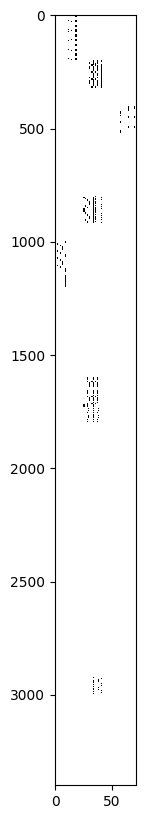

In [ ]:
fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(111)
ax.imshow(a, cmap = 'gray_r', interpolation = 'nearest')
ax.set_aspect(0.2)
plt.show()

In [ ]:
class GANMusicDatasetDeterministic(Dataset):
  def __init__(self, data, seq_length = 64):

    # Normalize
        self.data = data#.float() / 127.0  # Ensuring data is float
        self.seq_length = seq_length

  def __getitem__(self, index):
    x = self.data[:, (index * self.seq_length):(index+1) * self.seq_length, :]
    return x

  def __len__(self):
     return self.data.size(1) // self.seq_length

lambda_gp = 10  # Gradient penalty lambda hyperparameter

def compute_gradient_penalty(disc, real_samples, fake_samples):
    # Random weight term for interpolation between real and fake samples
    alpha = torch.rand((real_samples.size(0), 1, 1, 1), device=device)
    # Get random interpolation between real and fake samples
    interpolates = (alpha * real_samples + ((1 - alpha) * fake_samples)).requires_grad_(True)

    # Get the output from the discriminator
    disc_interpolates = disc(interpolates)

    if isinstance(disc_interpolates, tuple):
        disc_interpolates = disc_interpolates[0]

    fake = torch.ones(disc_interpolates.size(), requires_grad=False, device=device)

    # Get gradient w.r.t. interpolates
    gradients = torch.autograd.grad(
        outputs=disc_interpolates,
        inputs=interpolates,
        grad_outputs=fake,
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0]

    gradients = gradients.view(gradients.size(0), -1)
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return gradient_penalty

def save_generated_and_real_images(gen, real_samples, fake, epoch, threshold=0.9, save_dir='gen_imgs'):
    # Ensure the directory exists
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    # Function to save an image without axis and whitespace
    def save_image(data, filename):
        # Create a figure with no frame
        fig = plt.figure(figsize=(10, 10), frameon=False)
        # Create an Axes object with no frame and no axis
        ax = plt.Axes(fig, [0., 0., 1., 1.], )
        ax.set_axis_off()
        fig.add_axes(ax)
        # Display the image
        ax.imshow(data, cmap='gray_r', vmin=0, vmax=1, interpolation='nearest')
        # Save the figure with no padding or border
        fig.savefig(filename, bbox_inches='tight', pad_inches=0)
        plt.close(fig)

    # Process fake image
    fake = fake[0:17, :, :, :]
    fake = fake.permute(0, 2, 1, 3).flatten(2, 3).flatten(0, 1).transpose(0,1)
    fake_np = fake.detach().cpu().numpy()
    save_image(fake_np, f"{save_dir}/Epoch_{epoch}_Fake.png")

    # Apply threshold and save the second image (fake with threshold)
    fake_np[fake_np < threshold] = 0.0
    save_image(fake_np, f"{save_dir}/Epoch_{epoch}_Fake_Thresholded.png")

    # Process and save real image
    real = real_samples[0:17, :, :, :]
    real = real.permute(0, 2, 1, 3).flatten(2, 3).flatten(0, 1).transpose(0,1)
    real_np = real.detach().cpu().numpy()
    save_image(real_np, f"real_imgs/Epoch_{epoch}_Real.png")

def plot_and_save_losses(gen_losses, disc_losses, epochs, base_folder='training_plots'):
    # Ensure base folder exists
    if not os.path.exists(base_folder):
        os.makedirs(base_folder)

    # Separate folders for generator and discriminator losses
    gen_folder = os.path.join(base_folder, 'generator')
    disc_folder = os.path.join(base_folder, 'discriminator')

    # Ensure subfolders exist
    if not os.path.exists(gen_folder):
        os.makedirs(gen_folder)
    if not os.path.exists(disc_folder):
        os.makedirs(disc_folder)

    # Generate filenames with epochs
    gen_filename = os.path.join(gen_folder, f"generator_losses_epoch_{epochs}.png")
    disc_filename = os.path.join(disc_folder, f"discriminator_losses_epoch_{epochs}.png")

    # Plot for Generator Losses
    plt.figure(figsize=(10,5))
    plt.title(f"Generator Loss During Training - Epoch {epochs}")
    plt.plot(gen_losses, label="Generator Loss")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig(gen_filename)  # Save the figure for Generator Losses
    plt.show()

    # Plot for Discriminator Losses
    plt.figure(figsize=(10,5))
    plt.title(f"Discriminator Loss During Training - Epoch {epochs}")
    plt.plot(disc_losses, label="Discriminator Loss")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig(disc_filename)  # Save the figure for Discriminator Losses
    plt.show()

In [ ]:
def train_full_GAN(gen, disc, loader, z_dim, epochs=5, disp_batch_size=24, start_epoch=0, n_critic=3):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    gen = gen.to(device)
    disc = disc.to(device)

    # Optimizers
    disc_opt = torch.optim.Adam(disc.parameters(), lr=0.0006, betas=(0.5, 0.9))
    gen_opt = torch.optim.Adam(gen.parameters(), lr=0.0003, betas=(0.5, 0.9))
    step_size = 25
    decay_rate = 0.75
    # Create schedulers
    disc_scheduler = StepLR(disc_opt, step_size=step_size, gamma=decay_rate)
    gen_scheduler = StepLR(gen_opt, step_size=step_size, gamma=decay_rate)
    Tensor = torch.cuda.FloatTensor if device == 'cuda' else torch.FloatTensor

    # Fixed noise for visualizing progress
    fixed_noise = torch.randn(17, z_dim, device=device)

    gen_losses = []
    disc_losses = []

    for epoch in range(start_epoch, epochs):
        loop = tqdm(enumerate(loader), total=len(loader), leave=True)
        for i, real_imgs in loop:
          with torch.backends.cudnn.flags(enabled=False):

            # Configure input
            real_imgs = real_imgs.to(device)
            batch_size = real_imgs.size(0)

            # Sample noise as generator input
            z = torch.randn(batch_size, z_dim).to(device)

            # Generate a batch of images
            fake_imgs = gen(z)

            # ---------------------
            #  Train Discriminator
            # ---------------------

            disc_opt.zero_grad()

            # Measure discriminator's ability to classify real from generated samples
            real_validity = disc(real_imgs)
            fake_validity = disc(fake_imgs.detach())

            if isinstance(real_validity, tuple):
                real_validity = real_validity[0]
            if isinstance(fake_validity, tuple):
                fake_validity = fake_validity[0]

            gradient_penalty = compute_gradient_penalty(disc, real_imgs.data, fake_imgs.data)

            # wasserstein_loss+gradient_penalty
            d_loss = -torch.mean(real_validity) + torch.mean(fake_validity) + lambda_gp * gradient_penalty

            d_loss.backward()
            disc_opt.step()

            disc_losses.append(d_loss.item())

            # -----------------
            #  Train Generator
            # -----------------

            gen_opt.zero_grad()

            # Train the generator every n_critic steps
            if i % n_critic == 0:
                # Generate a batch of images
                z = torch.randn(batch_size, z_dim).to(device)
                fake_imgs = gen(z)

                # Loss measures generator's ability to fool the discriminator
                fake_validity = disc(fake_imgs)

                if isinstance(fake_validity, tuple):
                    fake_validity = fake_validity[0]

                g_loss = -torch.mean(fake_validity)

                g_loss.backward()
                gen_opt.step()

                gen_losses.append(g_loss.item())
                loop.set_description(f"Epoch [{epoch+1}/{epochs}] - "
                             f"Gen Loss: {gen_losses[-1]:.4f}, "
                             f"Disc Loss: {disc_losses[-1]:.4f}")

        disc_scheduler.step()
        gen_scheduler.step()
        # Save generated images for evaluation
        if (epoch + 1) % 10 == 0:
          save_generated_and_real_images(gen, real_imgs, fake_imgs, epoch + 1)

        # Save models at checkpoint
        if (epoch + 1) % 20 == 0:
            plot_and_save_losses(gen_losses, disc_losses, epoch)
            torch.save(gen.state_dict(), f'gan_checkpoint_gen_{epoch}.pth')
            torch.save(disc.state_dict(), f'gan_checkpoint_disc_{epoch}.pth')

            with open(f'gan_gen_loss_{epoch}.json', 'w') as outfile:
                json.dump(gen_losses, outfile)
            with open(f'gan_disc_loss_{epoch}.json', 'w') as outfile:
                json.dump(disc_losses, outfile)

In [ ]:
class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super(SelfAttention, self).__init__()
        self.query_conv = nn.Conv2d(in_channels, in_channels // 8, kernel_size=1)
        self.key_conv = nn.Conv2d(in_channels, in_channels // 8, kernel_size=1)
        self.value_conv = nn.Conv2d(in_channels, in_channels, kernel_size=1)

        self.softmax = nn.Softmax(dim=-2)  # Softmax over width
        self.gamma = nn.Parameter(torch.zeros(1))

    def forward(self, x):
        batch_size, C, height, width = x.size()
        query = self.query_conv(x).view(batch_size, -1, width * height).permute(0, 2, 1)
        key = self.key_conv(x).view(batch_size, -1, width * height)
        value = self.value_conv(x).view(batch_size, -1, width * height)

        attention = self.softmax(torch.bmm(query, key))
        out = torch.bmm(value, attention.permute(0, 2, 1))
        out = out.view(batch_size, C, height, width)

        out = self.gamma * out + x
        return out

# Input size: torch.Size([64, 17, 64, 72]) - (batch size,channels,height,width)

class DiscConvNet(nn.Module):
    def __init__(self, input_length=64):
        super(DiscConvNet, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=17, out_channels=16, kernel_size=(2, 72), stride=(2, 2))
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=16, kernel_size=(2, 1), stride=(2, 2))
        self.conv3 = nn.Conv2d(in_channels=16, out_channels=16, kernel_size=(2, 1), stride=(2, 2))
        self.conv4 = nn.Conv2d(in_channels=16, out_channels=16, kernel_size=(2, 1), stride=(2, 2))
        self.conv5 = nn.Conv2d(in_channels=16, out_channels=16, kernel_size=(2, 1), stride=(2, 2))

        self.attention = SelfAttention(in_channels=16)

        self.out = nn.Linear(16 * 2, 1)
        self.prelu = nn.PReLU()

        self.batch_norm_2d = nn.BatchNorm2d(16)
        self.dropout = nn.Dropout(0.5)

    def forward(self, input):
        x = self.prelu(self.batch_norm_2d(self.conv1(input)))
        x = self.dropout(x)
        x = self.prelu(self.batch_norm_2d(self.conv2(x)))
        x = self.dropout(x)
        x = self.attention(x)
        x = self.prelu(self.batch_norm_2d(self.conv3(x)))
        x = self.dropout(x)
        x = self.prelu(self.batch_norm_2d(self.conv4(x)))
        x = self.dropout(x)
        x = self.prelu(self.batch_norm_2d(self.conv5(x)))
        x = x.flatten(1, -1)

        x = self.out(x)
        return x

class GenConvNet(nn.Module):
    def __init__(self, z_dim=100, input_length=16):
        super(GenConvNet, self).__init__()
        self.z_dim = z_dim

        self.transpose_conv1 = nn.ConvTranspose2d(in_channels=z_dim, out_channels=64, kernel_size=(2, 1), stride=(2, 2))
        self.transpose_conv2 = nn.ConvTranspose2d(in_channels=64, out_channels=64, kernel_size=(2, 1), stride=(2, 2))
        self.transpose_conv3 = nn.ConvTranspose2d(in_channels=64, out_channels=64, kernel_size=(2, 1), stride=(2, 2))
        self.transpose_conv4 = nn.ConvTranspose2d(in_channels=64, out_channels=64, kernel_size=(2, 1), stride=(2, 2))
        self.transpose_conv5 = nn.ConvTranspose2d(in_channels=64, out_channels=64, kernel_size=(2, 1), stride=(2, 2))
        self.transpose_conv6 = nn.ConvTranspose2d(in_channels=64, out_channels=17, kernel_size=(2, 72), stride=(2, 2))

        self.attention = SelfAttention(in_channels=64)

        self.prelu = nn.PReLU()
        self.sigmoid = nn.Sigmoid()

        self.batch_norm_2d = nn.BatchNorm2d(64)

    def forward(self, input):

        x = input.view(-1, self.z_dim, 1, 1)
        x = self.prelu(self.batch_norm_2d(self.transpose_conv1(x)))
        x = self.prelu(self.batch_norm_2d(self.transpose_conv2(x)))
        x = self.prelu(self.batch_norm_2d(self.transpose_conv3(x)))
        x = self.prelu(self.batch_norm_2d(self.transpose_conv4(x)))
        x = self.attention(x)
        x = self.prelu(self.batch_norm_2d(self.transpose_conv5(x)))
        x = self.sigmoid(self.transpose_conv6(x))
        return x

In [ ]:
mini_dataset = GANMusicDatasetDeterministic(mini_data_concat_binary, seq_length = 64)
mini_loader = DataLoader(mini_dataset, batch_size = 64, drop_last=True)

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1 and classname.find('ConvNet') == -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

Epoch [1/100] - Gen Loss: -0.2082, Disc Loss: 3.8008: 100%|██████████| 102/102 [00:16<00:00,  6.26it/s]
Epoch [2/100] - Gen Loss: -0.2153, Disc Loss: 0.7791: 100%|██████████| 102/102 [00:19<00:00,  5.36it/s]
Epoch [3/100] - Gen Loss: -0.1439, Disc Loss: 0.4709: 100%|██████████| 102/102 [00:14<00:00,  6.88it/s]
Epoch [4/100] - Gen Loss: -0.2069, Disc Loss: 0.5497: 100%|██████████| 102/102 [00:13<00:00,  7.51it/s]
Epoch [5/100] - Gen Loss: -0.0625, Disc Loss: 0.4800: 100%|██████████| 102/102 [00:12<00:00,  7.90it/s]
Epoch [6/100] - Gen Loss: 0.0207, Disc Loss: 0.4515: 100%|██████████| 102/102 [00:12<00:00,  7.91it/s]
Epoch [7/100] - Gen Loss: -0.0838, Disc Loss: 0.3101: 100%|██████████| 102/102 [00:13<00:00,  7.55it/s]
Epoch [8/100] - Gen Loss: -0.0566, Disc Loss: 0.4282: 100%|██████████| 102/102 [00:14<00:00,  7.14it/s]
Epoch [9/100] - Gen Loss: -0.0319, Disc Loss: 0.5083: 100%|██████████| 102/102 [00:14<00:00,  6.86it/s]
Epoch [10/100] - Gen Loss: -0.1048, Disc Loss: 0.5533: 100%|█████

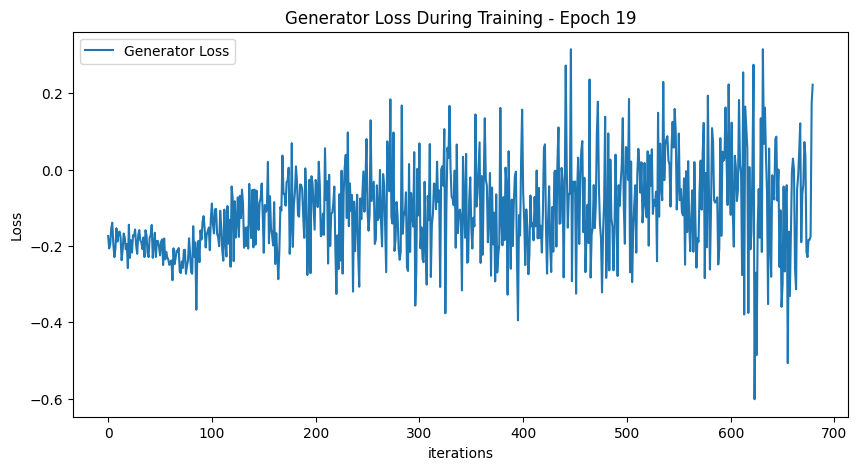

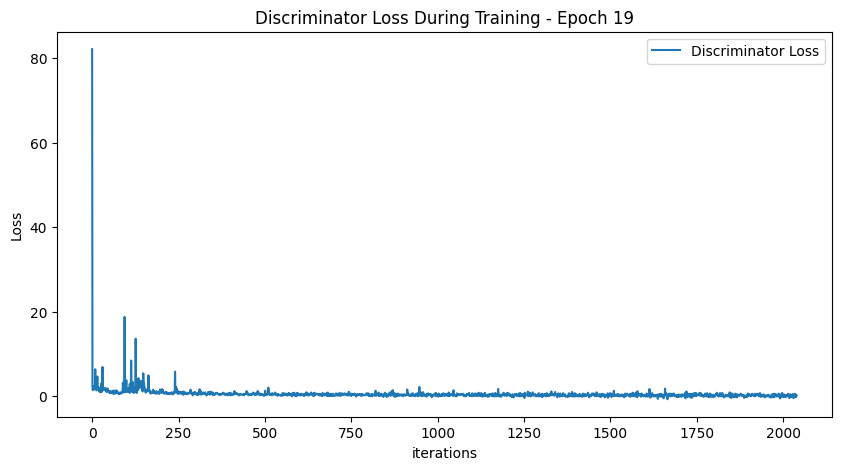

Epoch [21/100] - Gen Loss: 0.0889, Disc Loss: -0.0970: 100%|██████████| 102/102 [00:13<00:00,  7.46it/s]
Epoch [22/100] - Gen Loss: -0.2710, Disc Loss: 0.2396: 100%|██████████| 102/102 [00:15<00:00,  6.68it/s]
Epoch [23/100] - Gen Loss: 0.0909, Disc Loss: -0.0884: 100%|██████████| 102/102 [00:13<00:00,  7.38it/s]
Epoch [24/100] - Gen Loss: -0.0168, Disc Loss: 0.3073: 100%|██████████| 102/102 [00:12<00:00,  7.90it/s]
Epoch [25/100] - Gen Loss: -0.0978, Disc Loss: 0.0334: 100%|██████████| 102/102 [00:13<00:00,  7.65it/s]
Epoch [26/100] - Gen Loss: -0.3328, Disc Loss: 0.3256: 100%|██████████| 102/102 [00:13<00:00,  7.47it/s]
Epoch [27/100] - Gen Loss: 0.0280, Disc Loss: 0.2142: 100%|██████████| 102/102 [00:13<00:00,  7.44it/s]
Epoch [28/100] - Gen Loss: -0.0588, Disc Loss: -0.0321: 100%|██████████| 102/102 [00:13<00:00,  7.35it/s]
Epoch [29/100] - Gen Loss: -0.0266, Disc Loss: -0.1426: 100%|██████████| 102/102 [00:13<00:00,  7.44it/s]
Epoch [30/100] - Gen Loss: -0.4037, Disc Loss: 0.5385:

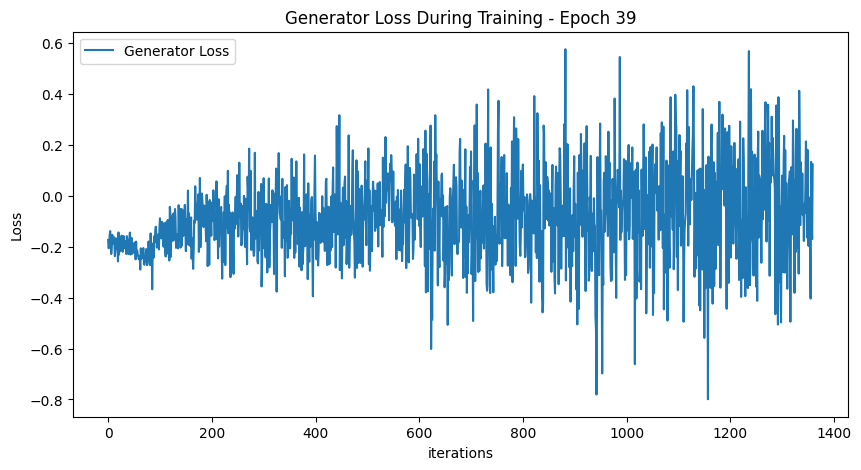

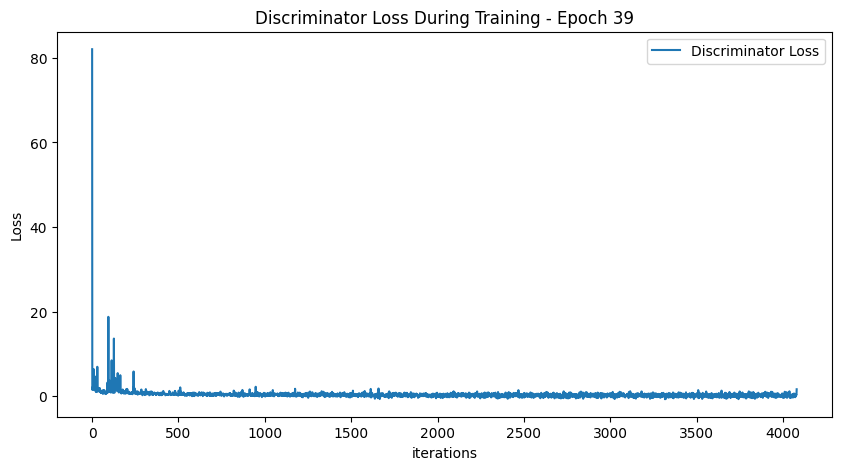

Epoch [41/100] - Gen Loss: -0.0552, Disc Loss: -0.4184: 100%|██████████| 102/102 [00:13<00:00,  7.41it/s]
Epoch [42/100] - Gen Loss: 0.2416, Disc Loss: 0.1939: 100%|██████████| 102/102 [00:13<00:00,  7.35it/s]
Epoch [43/100] - Gen Loss: -0.0346, Disc Loss: 0.0897: 100%|██████████| 102/102 [00:13<00:00,  7.43it/s]
Epoch [44/100] - Gen Loss: -0.1055, Disc Loss: 0.2503: 100%|██████████| 102/102 [00:13<00:00,  7.42it/s]
Epoch [45/100] - Gen Loss: -0.5307, Disc Loss: -0.2792: 100%|██████████| 102/102 [00:13<00:00,  7.45it/s]
Epoch [46/100] - Gen Loss: -0.3798, Disc Loss: -0.4176: 100%|██████████| 102/102 [00:13<00:00,  7.83it/s]
Epoch [47/100] - Gen Loss: 0.3973, Disc Loss: 0.9142: 100%|██████████| 102/102 [00:12<00:00,  7.86it/s]
Epoch [48/100] - Gen Loss: -0.7145, Disc Loss: 0.0922: 100%|██████████| 102/102 [00:13<00:00,  7.48it/s]
Epoch [49/100] - Gen Loss: 0.1381, Disc Loss: -0.0153: 100%|██████████| 102/102 [00:13<00:00,  7.50it/s]
Epoch [50/100] - Gen Loss: 0.6312, Disc Loss: 0.0929: 

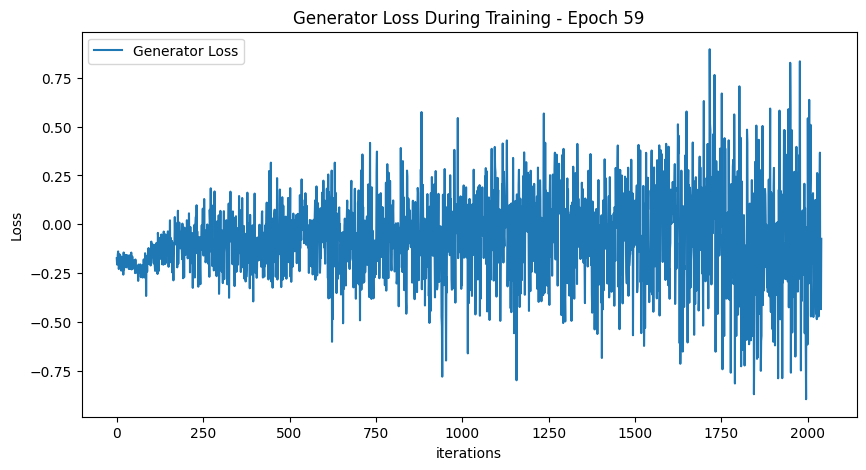

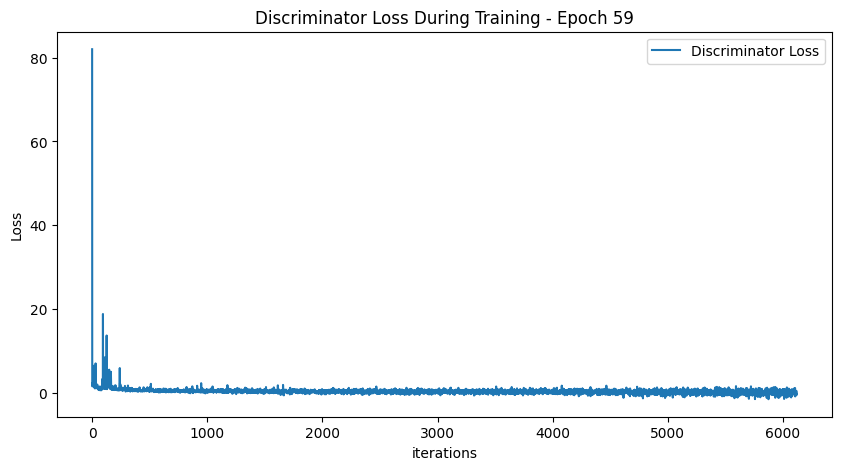

Epoch [61/100] - Gen Loss: 0.3156, Disc Loss: -0.8532: 100%|██████████| 102/102 [00:13<00:00,  7.55it/s]
Epoch [62/100] - Gen Loss: 0.3829, Disc Loss: -0.9048: 100%|██████████| 102/102 [00:13<00:00,  7.74it/s]
Epoch [63/100] - Gen Loss: 0.4151, Disc Loss: -1.3786: 100%|██████████| 102/102 [00:13<00:00,  7.51it/s]
Epoch [64/100] - Gen Loss: 0.1934, Disc Loss: -0.1052: 100%|██████████| 102/102 [00:14<00:00,  7.24it/s]
Epoch [65/100] - Gen Loss: 0.1246, Disc Loss: -0.6264: 100%|██████████| 102/102 [00:14<00:00,  7.28it/s]
Epoch [66/100] - Gen Loss: -0.0043, Disc Loss: -1.5071: 100%|██████████| 102/102 [00:13<00:00,  7.31it/s]
Epoch [67/100] - Gen Loss: -0.3154, Disc Loss: -0.0293: 100%|██████████| 102/102 [00:13<00:00,  7.29it/s]
Epoch [68/100] - Gen Loss: -1.4010, Disc Loss: -1.6545: 100%|██████████| 102/102 [00:13<00:00,  7.52it/s]
Epoch [69/100] - Gen Loss: -0.1734, Disc Loss: -1.3353: 100%|██████████| 102/102 [00:13<00:00,  7.73it/s]
Epoch [70/100] - Gen Loss: -0.5433, Disc Loss: -0.5

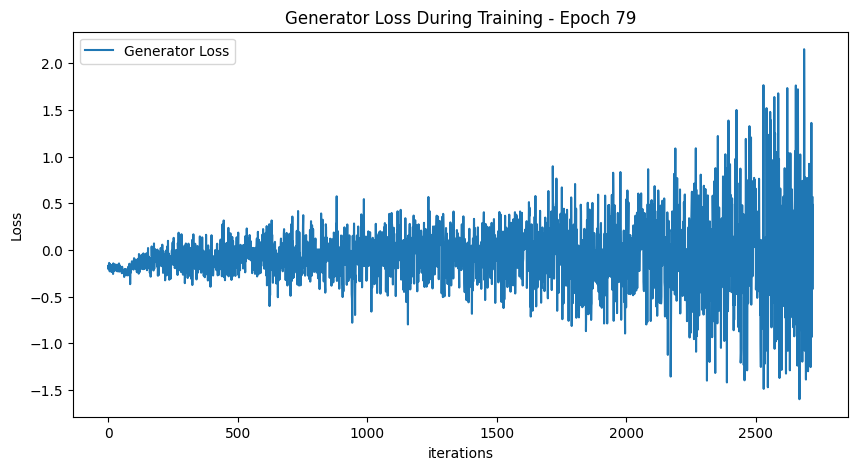

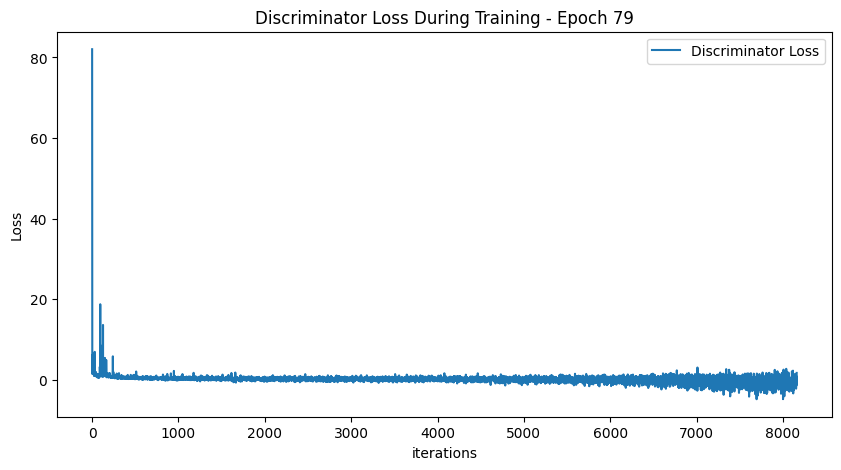

Epoch [81/100] - Gen Loss: 0.9946, Disc Loss: 0.6328: 100%|██████████| 102/102 [00:14<00:00,  7.22it/s]
Epoch [82/100] - Gen Loss: -0.3598, Disc Loss: -0.3368: 100%|██████████| 102/102 [00:13<00:00,  7.34it/s]
Epoch [83/100] - Gen Loss: -0.3585, Disc Loss: -2.2576: 100%|██████████| 102/102 [00:13<00:00,  7.30it/s]
Epoch [84/100] - Gen Loss: -1.7780, Disc Loss: -0.0278: 100%|██████████| 102/102 [00:13<00:00,  7.71it/s]
Epoch [85/100] - Gen Loss: 0.3378, Disc Loss: 0.8875: 100%|██████████| 102/102 [00:13<00:00,  7.65it/s]
Epoch [86/100] - Gen Loss: 1.0783, Disc Loss: -1.9410: 100%|██████████| 102/102 [00:13<00:00,  7.49it/s]
Epoch [87/100] - Gen Loss: -1.1629, Disc Loss: -1.2062: 100%|██████████| 102/102 [00:14<00:00,  7.28it/s]
Epoch [88/100] - Gen Loss: 0.4024, Disc Loss: -0.1808: 100%|██████████| 102/102 [00:13<00:00,  7.37it/s]
Epoch [89/100] - Gen Loss: 1.0914, Disc Loss: -3.4319: 100%|██████████| 102/102 [00:13<00:00,  7.38it/s]
Epoch [90/100] - Gen Loss: -0.0708, Disc Loss: -2.660

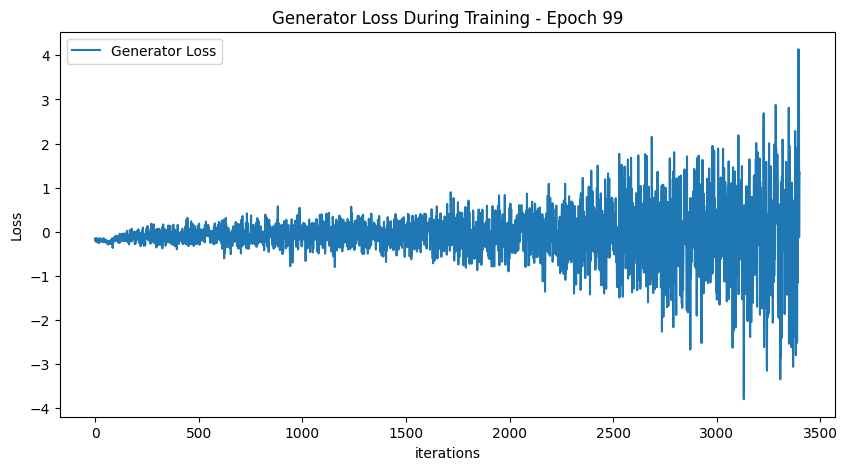

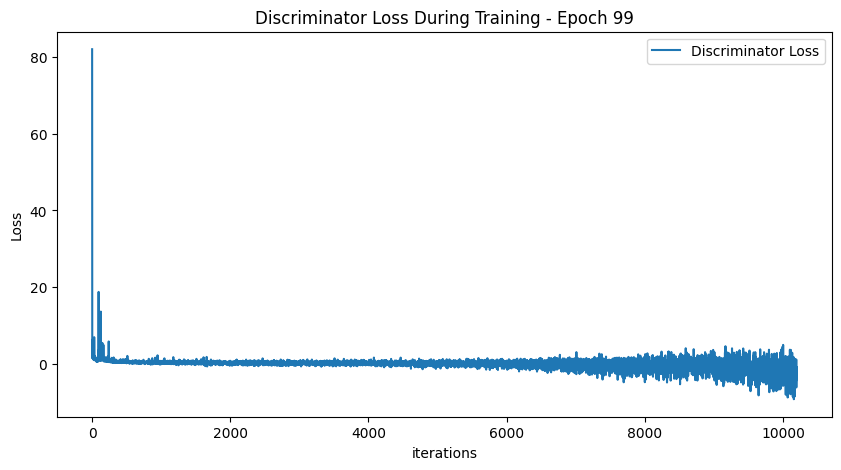

In [ ]:
z_dim = 100
disc = DiscConvNet()
gen = GenConvNet()
disc.apply(weights_init)
gen.apply(weights_init)
#gen.load_state_dict(torch.load(os.path.join(root_dir, 'GAN Checkpoints', 'gan_checkpoint_gen_99')))
#disc.load_state_dict(torch.load(os.path.join(root_dir, 'GAN Checkpoints', 'gan_checkpoint_disc_99')))
train_full_GAN(gen, disc, mini_loader, z_dim, epochs = 100, start_epoch = 0)

In [ ]:
# Generate some music samples
random_z = torch.randn((10,100)).to(device)
generated_sample = gen(random_z)
# Concatenate all the samples
generated_sample = generated_sample.permute(1, 0, 2, 3).flatten(1, 2)
# Bring back to 128 pitches
predictions = torch.zeros((17, 640, 128), dtype = torch.float32)
predictions[:, :, 24:96] = generated_sample
predictions[predictions < 0.7] = 0.0
predictions = predictions * 127

In [ ]:
torch.save(predictions, 'predictions.pt')

In [ ]:
loaded_predictions = torch.load('predictions.pt')
predictions = loaded_predictions.clone()

[<Axes: xlabel='time (beat)', ylabel='Drums\n\npitch'>,
 <Axes: xlabel='time (beat)', ylabel='Piano\n\npitch'>,
 <Axes: xlabel='time (beat)', ylabel='Chromatic Percussion\n\npitch'>,
 <Axes: xlabel='time (beat)', ylabel='Organ\n\npitch'>,
 <Axes: xlabel='time (beat)', ylabel='Guitar\n\npitch'>,
 <Axes: xlabel='time (beat)', ylabel='Bass\n\npitch'>,
 <Axes: xlabel='time (beat)', ylabel='Strings\n\npitch'>,
 <Axes: xlabel='time (beat)', ylabel='Ensemble\n\npitch'>,
 <Axes: xlabel='time (beat)', ylabel='Brass\n\npitch'>,
 <Axes: xlabel='time (beat)', ylabel='Reed\n\npitch'>,
 <Axes: xlabel='time (beat)', ylabel='Pipe\n\npitch'>,
 <Axes: xlabel='time (beat)', ylabel='Synth Lead\n\npitch'>,
 <Axes: xlabel='time (beat)', ylabel='Synth Pad\n\npitch'>,
 <Axes: xlabel='time (beat)', ylabel='Synth Effects\n\npitch'>,
 <Axes: xlabel='time (beat)', ylabel='Ethnic\n\npitch'>,
 <Axes: xlabel='time (beat)', ylabel='Percussive\n\npitch'>,
 <Axes: xlabel='time (beat)', ylabel='Sound Effects\n\npitch'>]

<Figure size 50000x50000 with 0 Axes>

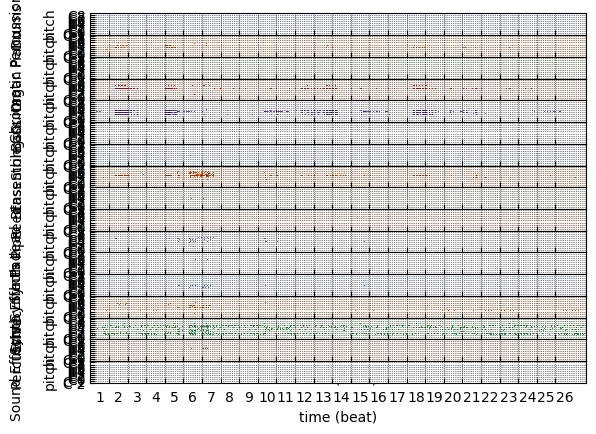

In [ ]:
# Define the program numbers and is_drum status for the tracks - change
track_info = {

    'Drums': {'program': 0, 'is_drum': True},
    'Piano': {'program': 0, 'is_drum': False},
    'Chromatic Percussion': {'program': 8, 'is_drum': False},
    'Organ': {'program': 16, 'is_drum': False},
    'Guitar': {'program': 24, 'is_drum': False},
    'Bass': {'program': 32, 'is_drum': False},
    'Strings': {'program': 40, 'is_drum': False},
    'Ensemble': {'program': 48, 'is_drum': False},
    'Brass': {'program': 56, 'is_drum': False},
    'Reed': {'program': 64, 'is_drum': False},
    'Pipe': {'program': 72, 'is_drum': False},
    'Synth Lead': {'program': 80, 'is_drum': False},
    'Synth Pad': {'program': 88, 'is_drum': False},
    'Synth Effects': {'program': 96, 'is_drum': False},
    'Ethnic': {'program': 104, 'is_drum': False},
    'Percussive': {'program': 112, 'is_drum': False},
    'Sound Effects': {'program': 120, 'is_drum': False}
}


# Create the tracks
tracks = []
for i, (track_name, info) in enumerate(track_info.items()):
   track = pypianoroll.StandardTrack(
       name=track_name,
       program=info['program'],
       is_drum=info['is_drum'],
       pianoroll=predictions[i].detach().cpu().numpy()
   )
   tracks.append(track)


# Create the multitrack object with the specified resolution and tempo
generated_multitrack = pypianoroll.Multitrack(
   name='Generated',
   resolution=24,
   tempo=np.full((predictions.shape[1],), 120.0),
   downbeat=np.zeros((predictions.shape[1],), dtype=bool),
   tracks=tracks
)


# Set the size of the plot
plt.figure(figsize=(500, 500))
# Plot the generated multitrack
generated_multitrack.plot()

In [ ]:
# Convert generated multitrack to pretty midi - with 17 tracks

In [ ]:
generated_pm = pypianoroll.to_pretty_midi(generated_multitrack)
generated_midi_audio = generated_pm.fluidsynth()
IPython.display.Audio(generated_midi_audio, rate = 44100)